In [17]:
import pandas as pd
from pandas_profiling import ProfileReport
import seaborn as sns
from sklearn.decomposition import PCA

In [5]:
seeds_dataset = pd.read_csv('C:/Users/chech/PC Febrero 2023/Platzi - Machine Learning/MLclasificacion/data/seeds.csv')

In [6]:
seeds_dataset

,area,perimeter,major_axis_length,minor_axis_length,convex_area,equiv_diameter,eccentricity,solidity,extent,roundness,aspect_ration,compactness,class
0,56276,888.242,326.1485,220.2388,56831,267.6805,0.7376,0.9902,0.7453,0.8963,1.4809,0.8207,Çerçevelik
1,76631,1068.146,417.1932,234.2289,77280,312.3614,0.8275,0.9916,0.7151,0.8440,1.7811,0.7487,Çerçevelik
2,71623,1082.987,435.8328,211.0457,72663,301.9822,0.8749,0.9857,0.7400,0.7674,2.0651,0.6929,Çerçevelik
3,66458,992.051,381.5638,222.5322,67118,290.8899,0.8123,0.9902,0.7396,0.8486,1.7146,0.7624,Çerçevelik
4,66107,998.146,383.8883,220.4545,67117,290.1207,0.8187,0.9850,0.6752,0.8338,1.7413,0.7557,Çerçevelik
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,79637,1224.710,533.1513,190.4367,80381,318.4289,0.9340,0.9907,0.4888,0.6672,2.7996,0.5973,Ürgüp Sivrisi
2496,69647,1084.318,462.9416,191.8210,70216,297.7874,0.9101,0.9919,0.6002,0.7444,2.4134,0.6433,Ürgüp Sivrisi
2497,87994,1210.314,507.2200,222.1872,88702,334.7199,0.8990,0.9920,0.7643,0.7549,2.2828,0.6599,Ürgüp Sivrisi
2498,80011,1182.947,501.9065,204.7531,80902,319.1758,0.9130,0.9890,0.7374,0.7185,2.4513,0.6359,Ürgüp Sivrisi


### EDA (Exploratory Data Analysis)

In [8]:
seeds_dataset.describe().round(2)

,area,perimeter,major_axis_length,minor_axis_length,convex_area,equiv_diameter,eccentricity,solidity,extent,roundness,aspect_ration,compactness
count,2500.00,2500.00,2500.00,2500.00,2500.00,2500.00,2500.00,2500.00,2500.00,2500.00,2500.00,2500.00
mean,80658.22,1130.28,456.60,225.79,81508.08,319.33,0.86,0.99,0.69,0.79,2.04,0.70
std,13664.51,109.26,56.24,23.30,13764.09,26.89,0.05,0.00,0.06,0.06,0.32,0.05
min,47939.00,868.48,320.84,152.17,48366.00,247.06,0.49,0.92,0.47,0.55,1.15,0.56
25%,70765.00,1048.83,414.96,211.25,71512.00,300.17,0.83,0.99,0.66,0.75,1.80,0.66
50%,79076.00,1123.67,449.50,224.70,79872.00,317.31,0.86,0.99,0.71,0.80,1.98,0.71
75%,89757.50,1203.34,492.74,240.67,90797.75,338.06,0.90,0.99,0.74,0.83,2.26,0.74
max,136574.00,1559.45,661.91,305.82,138384.00,417.00,0.95,0.99,0.83,0.94,3.14,0.90


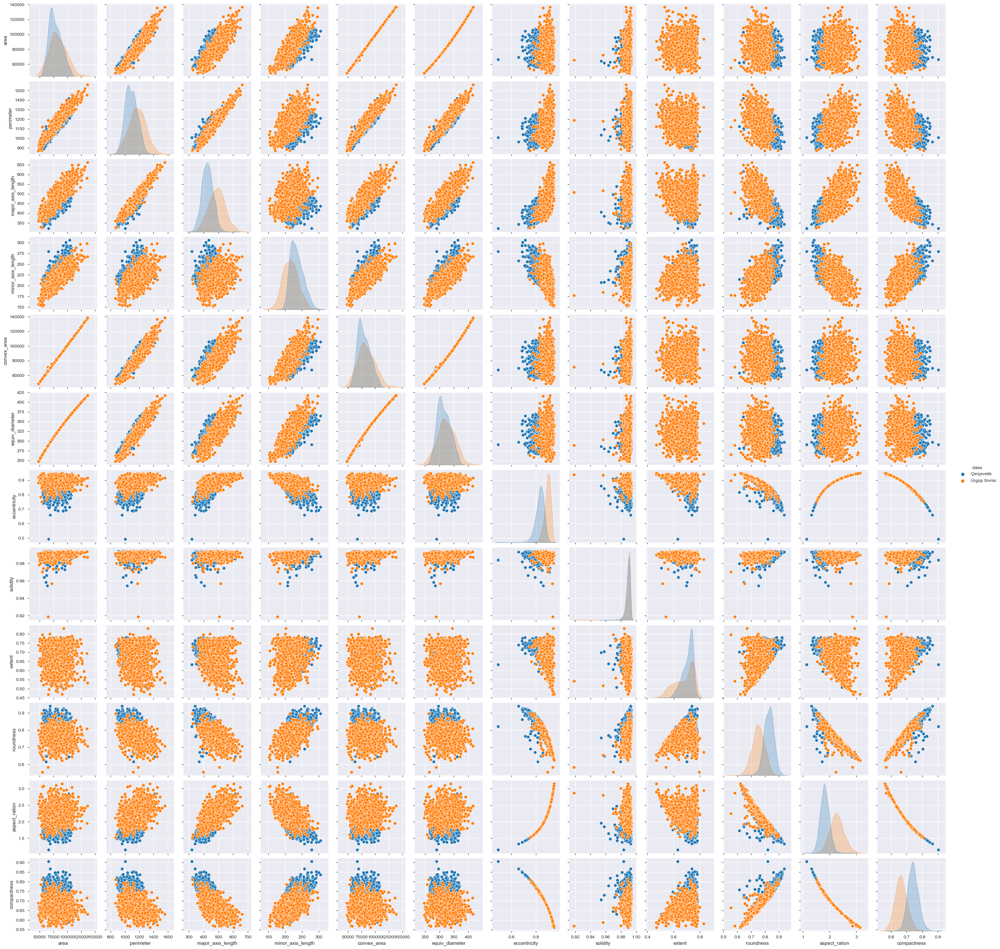

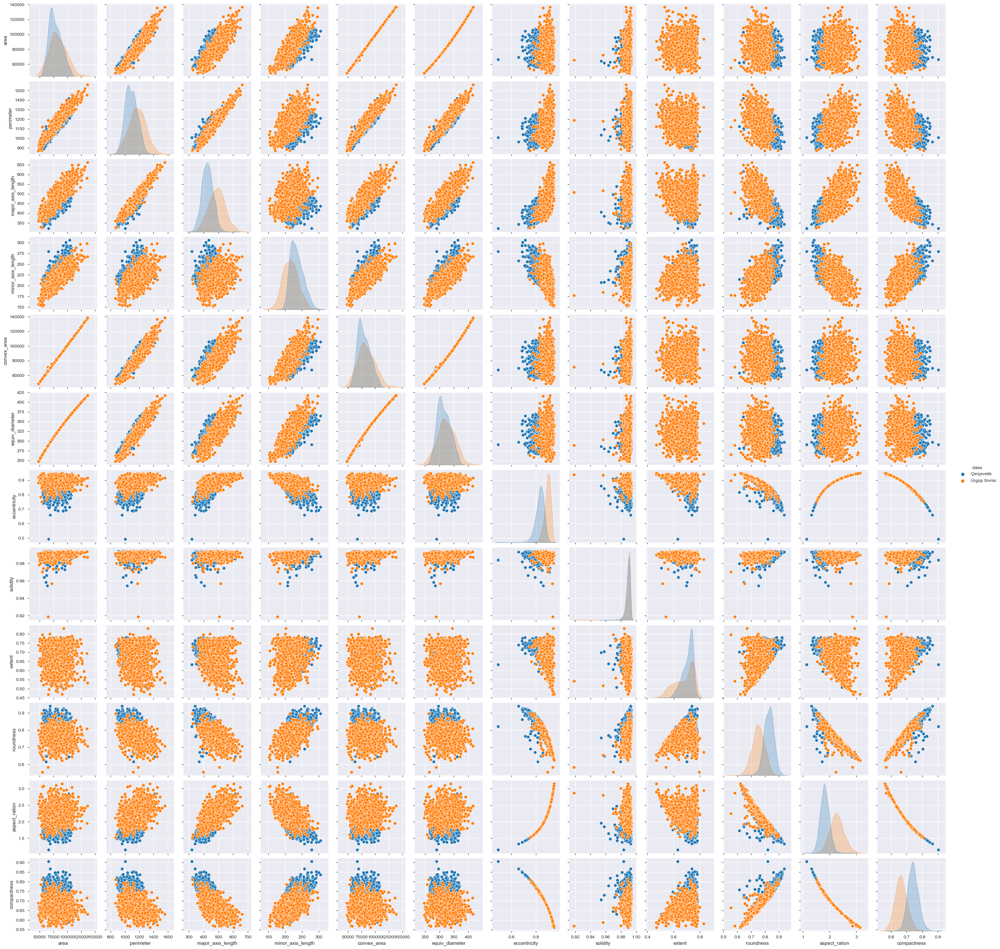

In [16]:
%matplotlib inline
sns.pairplot(data=seeds_dataset, hue='class')

## Algoritmo PCA - Descomposición de componentes principales.

In [18]:
seed_types = seeds_dataset[['class']]
seed_types

,class
0,Çerçevelik
1,Çerçevelik
2,Çerçevelik
3,Çerçevelik
4,Çerçevelik
...,...
2495,Ürgüp Sivrisi
2496,Ürgüp Sivrisi
2497,Ürgüp Sivrisi
2498,Ürgüp Sivrisi


In [19]:
# Eliminar las columnas con alta correlación y la columna "class" que es la target del modelo.
seed_data = seeds_dataset.drop(labels=['area', 'perimeter','class'], axis='columns')
seed_data

,major_axis_length,minor_axis_length,convex_area,equiv_diameter,eccentricity,solidity,extent,roundness,aspect_ration,compactness
0,326.1485,220.2388,56831,267.6805,0.7376,0.9902,0.7453,0.8963,1.4809,0.8207
1,417.1932,234.2289,77280,312.3614,0.8275,0.9916,0.7151,0.8440,1.7811,0.7487
2,435.8328,211.0457,72663,301.9822,0.8749,0.9857,0.7400,0.7674,2.0651,0.6929
3,381.5638,222.5322,67118,290.8899,0.8123,0.9902,0.7396,0.8486,1.7146,0.7624
4,383.8883,220.4545,67117,290.1207,0.8187,0.9850,0.6752,0.8338,1.7413,0.7557
...,...,...,...,...,...,...,...,...,...,...
2495,533.1513,190.4367,80381,318.4289,0.9340,0.9907,0.4888,0.6672,2.7996,0.5973
2496,462.9416,191.8210,70216,297.7874,0.9101,0.9919,0.6002,0.7444,2.4134,0.6433
2497,507.2200,222.1872,88702,334.7199,0.8990,0.9920,0.7643,0.7549,2.2828,0.6599
2498,501.9065,204.7531,80902,319.1758,0.9130,0.9890,0.7374,0.7185,2.4513,0.6359
